In [129]:
using JLD2
using StatsBase
using Plots
#backend(:plotly)
using DataFrames
using CSV

# Science Fair Results

**Inheritance Discrimination**

In [130]:
function dataRead(data, range, index::Int)
    df = CSV.read(data, DataFrame, delim=",")
    df = df[!, [2, 3, 5, 6, 8, 13, 14, 15, 16, 17, 4, 11, 10, 12, 7, 9, 1]] #used for soring by ben/cl, including graphCalcs
    #df = df[!, [6, 9, 2, 3, 7, 8, 10, 4, 5, 1]] #used for when sorting by pn/r
    #sort!(df, [:pn, :pr]) #used for when sorting by pn/r
    sort!(df, [:ben, :cl])
    dfData = Matrix{Float64}(df)
    dataArr = zeros(range, range, 1) #transforms [range^2 * 10] arr to [range, range, 1] arr
    for(i) in 1:range
        for(j) in 1:range
            dataArr[i, j, 1] = dfData[range*(i-1)+j, index]
        end
    end
    #print(dataArr)
    dataArr
end

function hmap(data::String, range::Int, index::Int, titles::String, cLow::Float64, chI::Float64) 
    #indexes : 1 yidx   2 xidx   3 coopFreq   4 degree   5 fitness  6 pnc_end   7 pnd_end   8 prc_end  9 prd_end  10 shortestPath 11 connComponents 12 meanCCSize 13 largestCC 14 mean connection distance 15 distance  16 inclusion  17 assortment 
    dataArr = dataRead(data, range, index)
    x_axis = String[]
    y_axis = String[]
    for(i) in 1:range #PNC/PND times 10
        push!(x_axis, (string(round((0.4*i/range); digits = 4))))
        push!(y_axis, (string(round((10*i/range); digits = 3))))
    end
    p = heatmap(x_axis, y_axis,  dataArr[:, :, 1]; title = titles, xlabel="CL",ylabel="BEN", clim=(cLow,chI))
    p
end

#redefined hmap() in between runs


hmap (generic function with 3 methods)

In [131]:
fig1hmaps = [hmap(file, 20, 3, "Cooperation Frequency", 0.0, 1.0), 
hmap(file, 20, 6, "PN", 0.0, 1.0), 
hmap(file, 20, 8, "PR", 0.0, 0.3),
hmap(file, 20, 10, "Mean Shortest Path", 1.0, 4.0), 
hmap(file, 20, 11, "Connected Components", 1.0, 45.0), 
hmap(file, 20, 12, "Mean Conn. Comp. Size", 1.0, 100.0), 
hmap(file, 20, 13, "Largest Conn. Comp.", 10.0, 100.0),
hmap(file, 20, 4, "Degree", 1.0, 75.0)] 

8-element Vector{Plots.Plot{Plots.GRBackend}}:
 Plot{Plots.GRBackend() n=1}
 Plot{Plots.GRBackend() n=1}
 Plot{Plots.GRBackend() n=1}
 Plot{Plots.GRBackend() n=1}
 Plot{Plots.GRBackend() n=1}
 Plot{Plots.GRBackend() n=1}
 Plot{Plots.GRBackend() n=1}
 Plot{Plots.GRBackend() n=1}

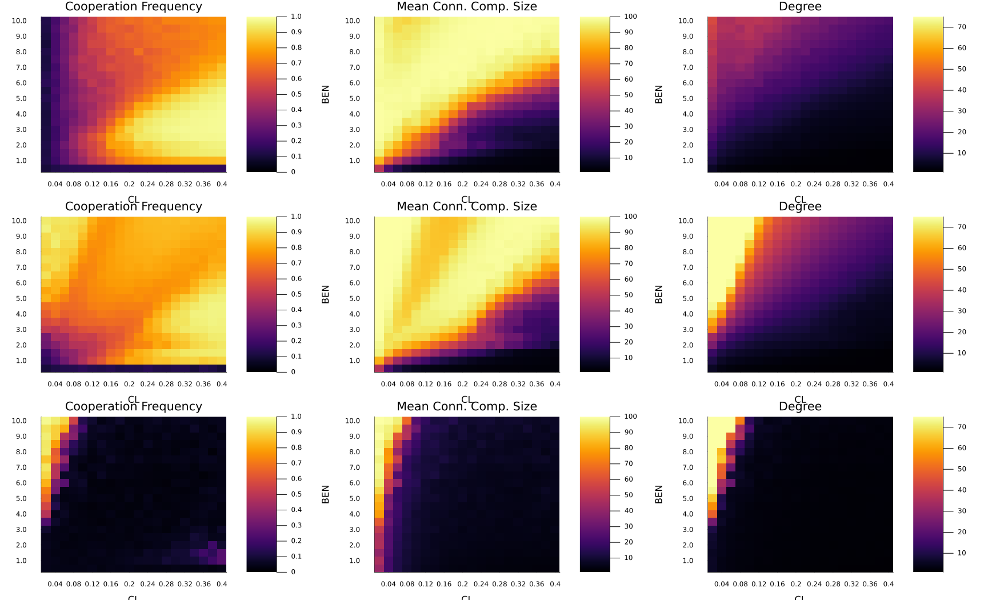

In [132]:
file = "anyMom_no_pnd_50_reps.csv"
file2 = "anyMom_pnd_50_reps.csv"
file3 = "sup_6_prd_new_graphs.csv"
fig1hmaps = [hmap(file, 20, 3, "Cooperation Frequency", 0.0, 1.0), 
hmap(file, 20, 12, "Mean Conn. Comp. Size", 1.0, 100.0), 
hmap(file, 20, 4, "Degree", 1.0, 75.0),
hmap(file2, 20, 3, "Cooperation Frequency", 0.0, 1.0), 
hmap(file2, 20, 12, "Mean Conn. Comp. Size", 1.0, 100.0), 
hmap(file2, 20, 4, "Degree", 1.0, 75.0),
hmap(file3, 20, 3, "Cooperation Frequency", 0.0, 1.0), 
hmap(file3, 20, 12, "Mean Conn. Comp. Size", 1.0, 100.0), 
hmap(file3, 20, 4, "Degree", 1.0, 75.0)
] 

plot(fig1hmaps..., colorbar = true, grid=false, layout = (3,3), size = (1750, 1050)) 

Figure S1. Cooperation frequency, size of the mean connected component, and degree (average number of connections per individual) for variants of inheritance discrimination over a range of benefits of cooperation (BEN) and cost of forming connections (CL). The upper row allows no inheritance discrimination (PNC= PND and PRC= PRD), the middle row allows inheritance discrimination for maternal contacts (PNC≠ PNC and PRC= PRD), and the bottom row allows inheritance discrimination for all individuals (PNC≠ PNC and PRC≠ PRD). All other inputs were controlled.

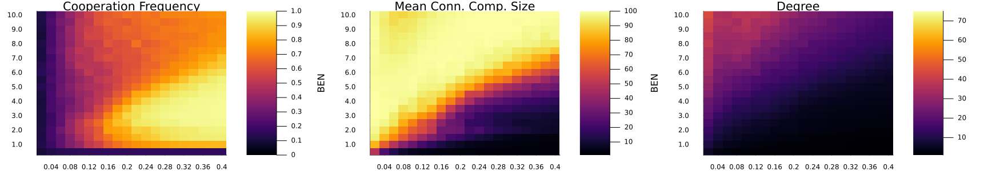

In [133]:
file = "anyMom_no_pnd_50_reps.csv"
file2 = "anyMom_pnd_50_reps.csv"
file3 = "sup_6_prd_new_graphs.csv"
fig1hmaps = [hmap(file, 20, 3, "Cooperation Frequency", 0.0, 1.0), 
hmap(file, 20, 12, "Mean Conn. Comp. Size", 1.0, 100.0), 
hmap(file, 20, 4, "Degree", 1.0, 75.0),

] 

plot(fig1hmaps..., colorbar = true, grid=false, layout = (1,3), size = (1750, 300)) 

Figure S2. Cooperation frequency, size of the mean connected component, and degree (average number of connections per individual) for variants of inheritance discrimination over a range of benefits of cooperation (BEN) and cost of forming connections (CL), with no inheritance discrimination (PNC=PND and PRC= PRD).


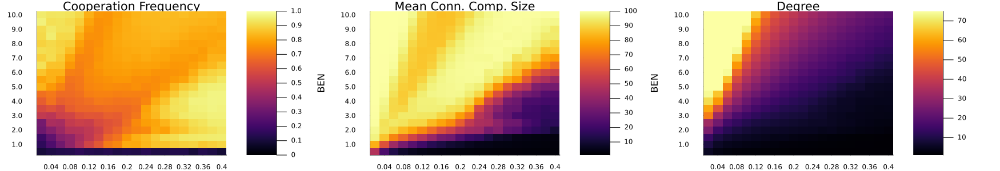

In [134]:
fig1hmaps = [hmap(file2, 20, 3, "Cooperation Frequency", 0.0, 1.0), 
hmap(file2, 20, 12, "Mean Conn. Comp. Size", 1.0, 100.0), 
hmap(file2, 20, 4, "Degree", 1.0, 75.0),

] 

plot(fig1hmaps..., colorbar = true, grid=false, layout = (1,3), size = (1750, 300)) 



Figure S3. Cooperation frequency, size of the mean connected component, and degree (average number of connections per individual) for variants of inheritance discrimination over a range of benefits of cooperation (BEN) and cost of forming connections (CL), with inheritance discrimination for maternal contacts (PNC≠ PNC and PRC= PRD).


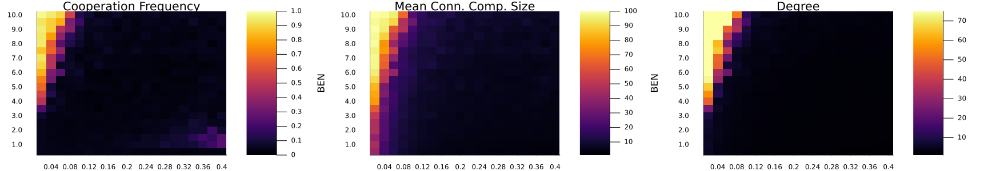

In [135]:
fig1hmaps = [hmap(file3, 20, 3, "Cooperation Frequency", 0.0, 1.0), 
hmap(file3, 20, 12, "Mean Conn. Comp. Size", 1.0, 100.0), 
hmap(file3, 20, 4, "Degree", 1.0, 75.0)

] 

plot(fig1hmaps..., colorbar = true, grid=false, layout = (1,3), size = (1750, 300)) 




Figure S4. Cooperation frequency, size of the mean connected component, and degree (average number of connections per individual) for variants of inheritance discrimination over a range of benefits of cooperation (BEN) and cost of forming connections (CL), with inheritance discrimination for all individuals (PNC≠ PNC and PRC≠ PRD). 


**Spatial Structure**

In [136]:
function dataRead(data, range, index::Int)
    df = CSV.read(data, DataFrame, delim=",")
    df = df[!, [2, 6, 4, 5, 8, 13, 14, 15, 16, 17, 3, 11, 10, 12, 7, 9, 1]] #used for soring by clratio/distFactor/distNeighborRange, including graphCalcs
    sort!(df, [:distNeighborRange, :cl])
    dfData = Matrix{Float64}(df)
    dataArr = zeros(range, range, 1) #transforms [range^2 * 10] arr to [range, range, 1] arr
    for(i) in 1:range
        for(j) in 1:range
            dataArr[i, j, 1] = dfData[range*(i-1)+j, index]
        end
    end
    dataArr
end

function hmap(data::String, range::Int, index::Int, titles::String, cLow::Float64, chI::Float64) 
    #indexes : 1 yidx   2 xidx   3 coopFreq   4 degree   5 fitness  6 pnc_end   7 pnd_end   8 prc_end  9 prd_end  10 shortestPath 11 connComponents 12 meanCCSize 13 largestCC 14 mean connection distance 15 distance  16 inclusion  17 assortment 
    dataArr = dataRead(data, range, index)
    x_axis = String[]
    y_axis = String[]
    for(i) in 1:range 
        push!(y_axis, (string(Int(floor(-1+51*i/range)))))
        push!(x_axis, (string(round(0.4*i/range; digits = 3))))
    end
    p = heatmap(x_axis, y_axis,  dataArr[:, :, 1]; title = titles, xlabel="CL",ylabel="Neighbor Range", clim=(cLow,chI))
    p
end

hmap (generic function with 3 methods)

In [137]:
function benClDataRead2(data, data2row, range, index::Int)
    df = CSV.read(data, DataFrame, delim=",")
    #df = df[!, [2, 6, 4, 5, 8, 13, 14, 15, 16, 17, 3, 11, 10, 12, 7, 9, 1]] #used for soring by clratio/distFactor/distNeighborRange, including graphCalcs
    df = df[!, [3, 2, 5, 6, 8, 13, 14, 15, 16, 17, 4, 11, 10, 12, 7, 9, 1]] #used for soring by ben/cl, including graphCalcs
    #df = df[!, [6, 9, 2, 3, 7, 8, 10, 4, 5, 1]] #used for when sorting by pn/r
    #sort!(df, [:pn, :pr]) #used for when sorting by pn/r
    sort!(df, [:ben, :cl])
    dfData = Matrix{Float64}(df)
    dataArr = zeros(range, range, 1) #transforms [range^2 * 10] arr to [range, range, 1] arr
    for(i) in 1:range
        dataArr[i, 1, 1] = dfData[i+range*data2row, index]
    end
    #print(dataArr)
    dataArr
end

function dataReadMinus(data, data2, data2row, range, index::Int)
    df = CSV.read(data, DataFrame, delim=",")
    df = df[!, [2, 6, 4, 5, 8, 13, 14, 15, 16, 17, 3, 11, 10, 12, 7, 9, 1]] #used for soring by clratio/distFactor/distNeighborRange, including graphCalcs
    sort!(df, [:cl, :distNeighborRange])
    dfData = Matrix{Float64}(df)
    #print(df)
    dataArr = zeros(range, range, 1) #transforms [range^2 * 10] arr to [range, range, 1] arr
    for(i) in 1:range
        for(j) in 1:range
            dataArr[i, j, 1] = dfData[range*(i-1)+j, index]
        end
    end
    benclData = benClDataRead2(data2, data2row, range, index)
    for(i) in 1:range
        #println(benclData[i, 4, 1], " subt from ", dataArr[i, 20, 1], " equals ", dataArr[i, 20, 1]-benclData[i, 4, 1])
        dataArr[i, :, 1] .-= benclData[i, 1, 1]
    end   
	tempData = transpose(dataArr[:, :, 1])
    return tempData
end

function hmap(data::String, data2::String, data2row::Int, range::Int, index::Int, titles::String, cLow::Float64, chI::Float64) 
    #indexes : 1 yidx   2 xidx   3 coopFreq   4 degree   5 fitness  6 pnc_end   7 pnd_end   8 prc_end  9 prd_end  10 shortestPath 11 connComponents 12 meanCCSize 13 largestCC 14 mean connection distance 15 distance  16 inclusion  17 assortment 
    dataArr = dataReadMinus(data, data2, data2row, range, index)
    x_axis = String[]
    y_axis = String[]
    for(i) in 1:range 
        push!(y_axis, (string(Int(floor(-1+51*i/range)))))
        push!(x_axis, (string(round(0.4*i/range; digits = 3))))
    end
    p = heatmap(x_axis, y_axis,  dataArr[:, :]; title = titles, c=cgrad(:bluesreds), xlabel="CL",ylabel="Neighbor Range", clim=(cLow,chI))
    p
end

hmap (generic function with 3 methods)

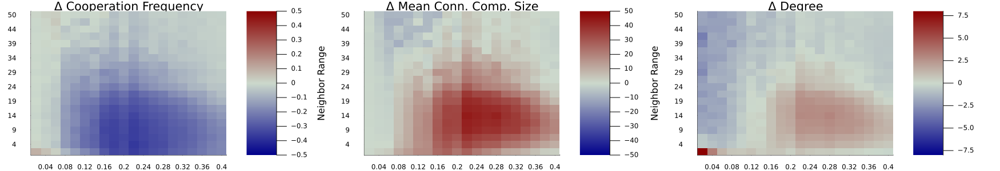

In [138]:
newdata = "NR-50-no-pnd-more-reps.csv"
compData = "anyMom_no_pnd_50_reps.csv"



fig1hmaps = [hmap(newdata, compData, 4, 20, 3, "Δ Cooperation Frequency", -0.5, 0.5), 
hmap(newdata, compData, 4, 20, 12, "Δ Mean Conn. Comp. Size", -50.0, 50.0), 
hmap(newdata, compData, 4, 20, 4, "Δ Degree", -8.0, 8.0)
]

plot(fig1hmaps..., colorbar = true, grid=false, layout = (1,3), size = (1750, 300)) 


Figure S5. Differences between cooperation frequencies, mean connected component size, and degrees between spatial structures determined by various neighbor ranges (y-axis) and the results in Figure 3. The results were compared at benefit 2.0. All other inputs were controlled. There was no The upper inheritance discrimination (PNC= PND and PRC= PRD).


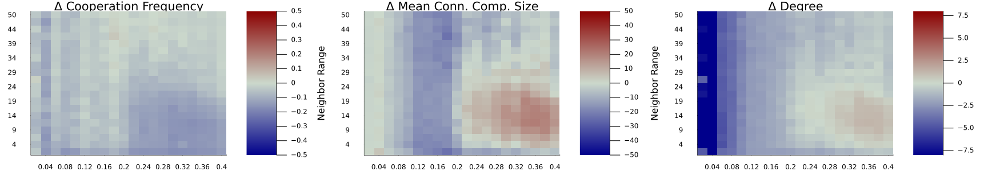

In [139]:
newdata = "neighborRange-1-50-more-reps.csv"
compData = "anyMom_pnd_50_reps.csv"



fig1hmaps = [hmap(newdata, compData, 4, 20, 3, "Δ Cooperation Frequency", -0.5, 0.5), 
hmap(newdata, compData, 4, 20, 12, "Δ Mean Conn. Comp. Size", -50.0, 50.0), 
hmap(newdata, compData, 4, 20, 4, "Δ Degree", -8.0, 8.0)
]

plot(fig1hmaps..., colorbar = true, grid=false, layout = (1,3), size = (1750, 300)) 


Figure S6. Differences between cooperation frequencies, mean connected component size, and degrees between spatial structures determined by various neighbor ranges (y-axis) and the results in Figure 3. The results were compared at benefit 2.0. All other inputs were controlled. There was inheritance discrimination for maternal contacts (PNC≠ PNC and PRC= PRD).


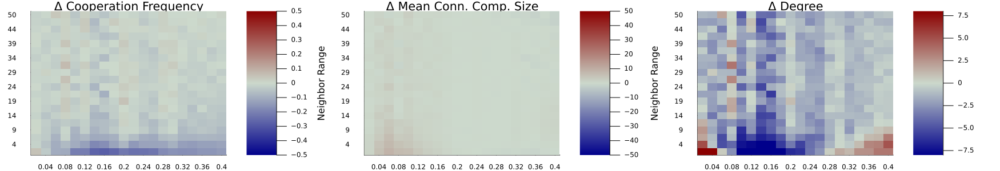

In [140]:
newdata = "NR-50-9.0-ben-no-pnd.csv"
compData = "anyMom_no_pnd_50_reps.csv"

fig1hmaps = [hmap(newdata, compData, 18, 20, 3, "Δ Cooperation Frequency", -0.5, 0.5), 
hmap(newdata, compData, 18, 20, 12, "Δ Mean Conn. Comp. Size", -50.0, 50.0), 
hmap(newdata, compData, 18, 20, 4, "Δ Degree", -8.0, 8.0)
]

plot(fig1hmaps..., colorbar = true, grid=false, layout = (1,3), size = (1750, 300)) 


Figure S7. Differences between cooperation frequencies, mean connected component size, and degrees between spatial structures determined by various neighbor ranges and the results in Figure 3. All results were compared at benefit 9.0 and without inheritance discrimination (PNC= PND and PRC= PRD). All other inputs were controlled.


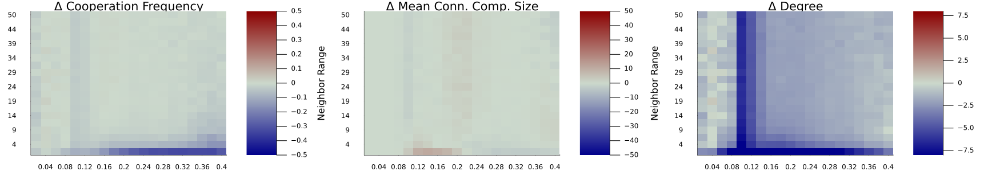

In [141]:
newdata = "NR-50-9.0-ben-pnd.csv"
compData = "anyMom_pnd_50_reps.csv"

fig1hmaps = [hmap(newdata, compData, 18, 20, 3, "Δ Cooperation Frequency", -0.5, 0.5), 
hmap(newdata, compData, 18, 20, 12, "Δ Mean Conn. Comp. Size", -50.0, 50.0), 
hmap(newdata, compData, 18, 20, 4, "Δ Degree", -8.0, 8.0)
]

plot(fig1hmaps..., colorbar = true, grid=false, layout = (1,3), size = (1750, 300)) 


Figure S8. Differences between cooperation frequencies, mean connected component size, and degrees between spatial structures determined by various neighbor ranges and the results in Figure 3. All results were compared at benefit 9.0 and with inheritance discrimination for paternal contacts (PNC≠ PND and PRC= PRD). All other inputs were controlled.


# Capstone Paper Results

WIP Capstone Paper: https://docs.google.com/document/d/19r8U5RyQP48V_HN9bM1eJuVsHZsI0ZtPC-SI_5b-wSA/edit?usp=sharing

**Inheritance Discrimination**

In [142]:
function dataRead(data, range, index::Int)
    df = CSV.read(data, DataFrame, delim=",")
    df = df[!, [2, 3, 5, 6, 8, 13, 14, 15, 16, 17, 4, 11, 10, 12, 7, 9, 1]] #used for soring by ben/cl, including graphCalcs
    #df = df[!, [6, 9, 2, 3, 7, 8, 10, 4, 5, 1]] #used for when sorting by pn/r
    #sort!(df, [:pn, :pr]) #used for when sorting by pn/r
    sort!(df, [:ben, :cl])
    dfData = Matrix{Float64}(df)
    dataArr = zeros(range, range, 1) #transforms [range^2 * 10] arr to [range, range, 1] arr
    for(i) in 1:range
        for(j) in 1:range
            dataArr[i, j, 1] = dfData[range*(i-1)+j, index]
        end
    end
    #print(dataArr)
    dataArr
end

function hmap(data::String, range::Int, index::Int, titles::String, cLow::Float64, chI::Float64) 
    #indexes : 1 yidx   2 xidx   3 coopFreq   4 degree   5 fitness  6 pnc_end   7 pnd_end   8 prc_end  9 prd_end  10 shortestPath 11 connComponents 12 meanCCSize 13 largestCC 14 mean connection distance 15 distance  16 inclusion  17 assortment 
    dataArr = dataRead(data, range, index)
    x_axis = String[]
    y_axis = String[]
    for(i) in 1:range #PNC/PND times 10
        push!(x_axis, (string(round((0.4*i/range); digits = 4))))
        push!(y_axis, (string(round((10*i/range); digits = 3))))
    end
    p = heatmap(x_axis, y_axis,  dataArr[:, :, 1]; title = titles, xlabel="CL\n\n",ylabel="BEN", clim=(cLow,chI))
    p
end

#redefined hmap() in between runs


hmap (generic function with 3 methods)

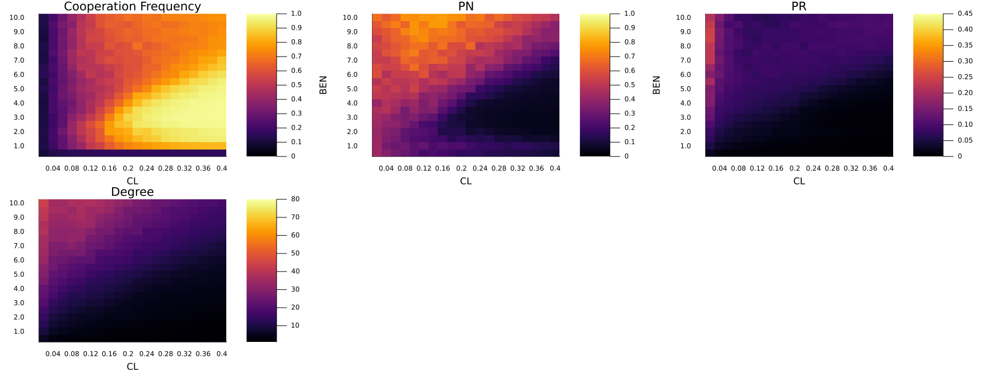

In [143]:
file = "anyMom_no_pnd_50_reps.csv"
fig1hmaps = [hmap(file, 20, 3, "Cooperation Frequency", 0.0, 1.0), 
hmap(file, 20, 6, "PN", 0.0, 1.0), 
hmap(file, 20, 8, "PR", 0.0, 0.45),
hmap(file, 20, 4, "Degree", 1.0, 80.0),
] 

plot(fig1hmaps..., colorbar = true, grid=false, layout = (2,3), size = (1750, 650)) 


Figure A1. Cooperation Frequency, PN, PR, and Degree over a range of costs of linking (CL) and benefits of cooperation (BEN) and other inputs (C=0.5, gen=100000, pn0=0.5, distInherit=false, pr0=0.0001, μ=0.01, δ=0.5, σpn=0.01, σpr=0.01, reps=50), with no inheritance discrimination (PNC=PND and PRC=PRD). The population size was 100.

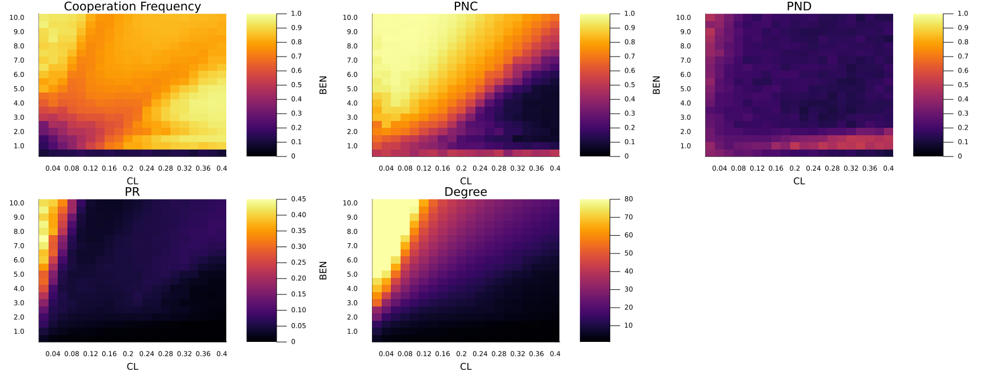

In [144]:
file = "anyMom_pnd_50_reps.csv"
fig1hmaps = [hmap(file, 20, 3, "Cooperation Frequency", 0.0, 1.0), 
hmap(file, 20, 6, "PNC", 0.0, 1.0), 
hmap(file, 20, 7, "PND", 0.0, 1.0),
hmap(file, 20, 8, "PR", 0.0, 0.45),
hmap(file, 20, 4, "Degree", 1.0, 80.0),
] 

plot(fig1hmaps..., colorbar = true, grid=false, layout = (2,3), size = (1750, 650)) 


Figure A2. Cooperation Frequency, PNC, PND, PR, and Degree over a range of costs of linking (CL) and benefits of cooperation (BEN) and other inputs (C=0.5, gen=100000, pn0=0.5, distInherit=false, pr0=0.0001, μ=0.01, δ=0.5, σpn=0.01, σpr=0.01, reps=50), with inheritance discrimination for only paternal contacts (PNC≠PND and PRC=PRD). The population size was 100.

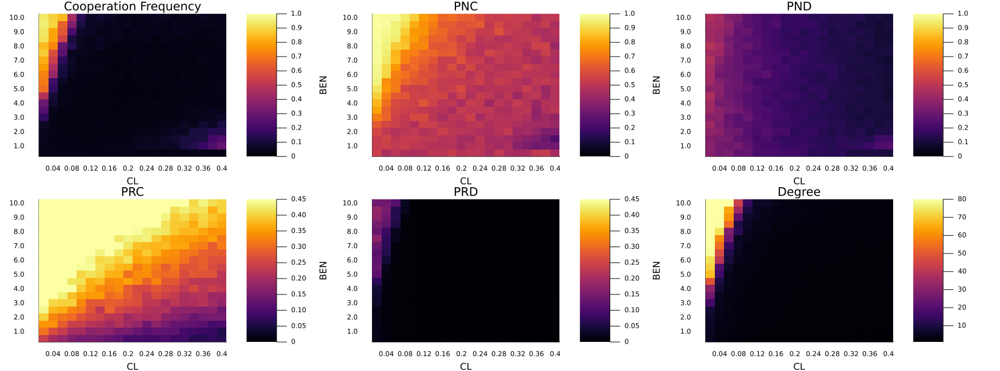

In [145]:
file = "anyMom_prd_50_reps.csv"
fig1hmaps = [hmap(file, 20, 3, "Cooperation Frequency", 0.0, 1.0), 
hmap(file, 20, 6, "PNC", 0.0, 1.0), 
hmap(file, 20, 7, "PND", 0.0, 1.0),
hmap(file, 20, 8, "PRC", 0.0, 0.45),
hmap(file, 20, 9, "PRD", 0.0, 0.45),
hmap(file, 20, 4, "Degree", 1.0, 80.0),
] 

plot(fig1hmaps..., colorbar = true, grid=false, layout = (2,3), size = (1750, 650)) 


Figure A3. Cooperation Frequency, PNC, PND, PRC, PRD, and Degree over a range of costs of linking (CL) and benefits of cooperation (BEN) and other inputs (C=0.5, gen=100000, pn0=0.5, distInherit=false, pr0=0.0001, μ=0.01, δ=0.5, σpn=0.01, σpr=0.01, reps=50), with inheritance discrimination for all individuals (PNC≠PND and PRC≠PRD). The population size was 100.

**Spatial Structure**

In [154]:
function benClDataRead2(data, data2row, range, index::Int)
    df = CSV.read(data, DataFrame, delim=",")
    #df = df[!, [2, 6, 4, 5, 8, 13, 14, 15, 16, 17, 3, 11, 10, 12, 7, 9, 1]] #used for soring by clratio/distFactor/distNeighborRange, including graphCalcs
    df = df[!, [3, 2, 5, 6, 8, 13, 14, 15, 16, 17, 4, 11, 10, 12, 7, 9, 1]] #used for soring by ben/cl, including graphCalcs
    #df = df[!, [6, 9, 2, 3, 7, 8, 10, 4, 5, 1]] #used for when sorting by pn/r
    #sort!(df, [:pn, :pr]) #used for when sorting by pn/r
    sort!(df, [:ben, :cl])
    dfData = Matrix{Float64}(df)
    dataArr = zeros(range, range, 1) #transforms [range^2 * 10] arr to [range, range, 1] arr
    for(i) in 1:range
        dataArr[i, 1, 1] = dfData[i+range*data2row, index]
    end
    #print(dataArr)
    dataArr
end

function dataReadMinus(data, data2, data2row, range, index::Int)
    df = CSV.read(data, DataFrame, delim=",")
    df = df[!, [2, 6, 4, 5, 8, 13, 14, 15, 16, 17, 3, 11, 10, 12, 7, 9, 1]] #used for soring by clratio/distFactor/distNeighborRange, including graphCalcs
    sort!(df, [:cl, :distNeighborRange])
    dfData = Matrix{Float64}(df)
    #print(df)
    dataArr = zeros(range, range, 1) #transforms [range^2 * 10] arr to [range, range, 1] arr
    for(i) in 1:range
        for(j) in 1:range
            dataArr[i, j, 1] = dfData[range*(i-1)+j, index]
        end
    end
    benclData = benClDataRead2(data2, data2row, range, index)
    for(i) in 1:range
        #println(benclData[i, 4, 1], " subt from ", dataArr[i, 20, 1], " equals ", dataArr[i, 20, 1]-benclData[i, 4, 1])
        dataArr[i, :, 1] .-= benclData[i, 1, 1]
    end   
	tempData = transpose(dataArr[:, :, 1])
    return tempData
end

function hmap(data::String, data2::String, data2row::Int, range::Int, index::Int, titles::String, cLow::Float64, chI::Float64) 
    #indexes : 1 yidx   2 xidx   3 coopFreq   4 degree   5 fitness  6 pnc_end   7 pnd_end   8 prc_end  9 prd_end  10 shortestPath 11 connComponents 12 meanCCSize 13 largestCC 14 mean connection distance 15 distance  16 inclusion  17 assortment 
    dataArr = dataReadMinus(data, data2, data2row, range, index)
    x_axis = String[]
    y_axis = String[]
    for(i) in 1:range 
        push!(y_axis, (string(Int(floor(-1+51*i/range)))))
        push!(x_axis, (string(round(0.4*i/range; digits = 3))))
    end
    p = heatmap(x_axis, y_axis,  dataArr[:, :]; title = titles, c=cgrad(:bluesreds), xlabel="CL\n\n",ylabel="Neighbor Range", clim=(cLow,chI))
    p
end

hmap (generic function with 3 methods)

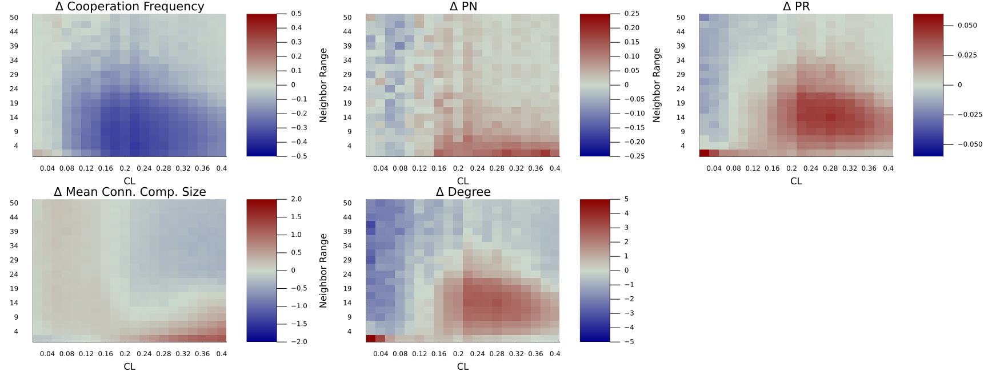

In [147]:
newdata = "NR-50-no-pnd-more-reps.csv"
compData = "anyMom_no_pnd_50_reps.csv"

fig1hmaps = [hmap(newdata, compData, 4, 20, 3, "Δ Cooperation Frequency", -0.5, 0.5), 
hmap(newdata, compData, 4, 20, 6, "Δ PN", -0.25, 0.25), 
hmap(newdata, compData, 4, 20, 8, "Δ PR", -0.06, 0.06),
hmap(newdata, compData, 4, 20, 10, "Δ Mean Conn. Comp. Size", -2.0, 2.0), 
hmap(newdata, compData, 4, 20, 4, "Δ Degree", -5.0, 5.0)
]

plot(fig1hmaps..., colorbar = true, grid=false, layout = (2,3), size = (1750, 650)) 


Figure A4. Difference of cooperation frequency, PN, PR, mean connected component size, and degree at low benefits of cooperation between various strengths of spatial structure and no spatial structure, over a range of neighborRange (with 50 being identical to anyMom) and costs of forming connections (CL), with other inputs (B=2.0, C=0.5, gen=100000, pn0=0.5, distInherit=false, pr0=0.0001, μ=0.01, δ=0.5, σpn=0.01, σpr=0.01, reps=50, population size = 100) being held constant. There was no inheritance discrimination (PNC=PND and PRC=PRD).


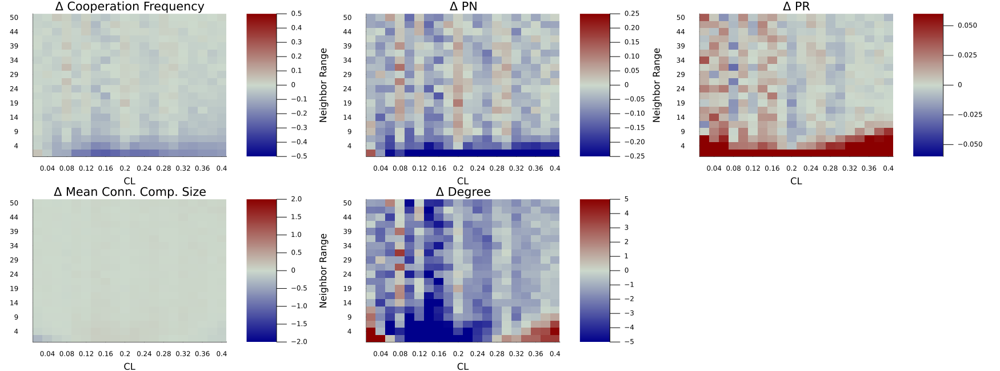

In [155]:
newdata = "NR-50-9.0-ben-no-pnd.csv"
compData = "anyMom_no_pnd_50_reps.csv"

fig1hmaps = [hmap(newdata, compData, 18, 20, 3, "Δ Cooperation Frequency", -0.5, 0.5), 
hmap(newdata, compData, 18, 20, 6, "Δ PN", -0.25, 0.25), 
hmap(newdata, compData, 18, 20, 8, "Δ PR", -0.06, 0.06),
hmap(newdata, compData, 18, 20, 10, "Δ Mean Conn. Comp. Size", -2.0, 2.0), 
hmap(newdata, compData, 18, 20, 4, "Δ Degree", -5.0, 5.0)
]

plot(fig1hmaps..., colorbar = true, grid=false, layout = (2,3), size = (1750, 650)) 


Figure A5. Difference of cooperation frequency, PN, PR, mean connected component size, and degree at high benefits of cooperation between various strengths of spatial structure and no spatial structure, over a range of neighborRange (with 50 being identical to anyMom) and costs of forming connections (CL), with other inputs (B=9.0, C=0.5, gen=100000, pn0=0.5, distInherit=false, pr0=0.0001, μ=0.01, δ=0.5, σpn=0.01, σpr=0.01, reps=50, population size = 100) being held constant. There was no inheritance discrimination (PNC=PND and PRC=PRD).

In [149]:
function benClDataRead(data, range, index::Int)
    df = CSV.read(data, DataFrame, delim=",")
    df = df[!, [2, 3, 5, 6, 8, 13, 14, 15, 16, 17, 4, 11, 10, 12, 7, 9, 1]] #used for soring by ben/cl, including graphCalcs
    #df = df[!, [6, 9, 2, 3, 7, 8, 10, 4, 5, 1]] #used for when sorting by pn/r
    #sort!(df, [:pn, :pr]) #used for when sorting by pn/r
    sort!(df, [:ben, :cl])
    dfData = Matrix{Float64}(df)
    dataArr = zeros(range, range, 1) #transforms [range^2 * 10] arr to [range, range, 1] arr
    for(i) in 1:range
        for(j) in 1:range
            dataArr[i, j, 1] = dfData[range*(i-1)+j, index]
        end
    end
    dataArr
end

function benclDataReadMinus(data, data2, range, index::Int)
    df = CSV.read(data, DataFrame, delim=",")
    df = df[!, [2, 3, 5, 6, 8, 13, 14, 15, 16, 17, 4, 11, 10, 12, 7, 9, 1]] #used for soring by ben/cl, including graphCalcs
    sort!(df, [:ben, :cl])
    dfData = Matrix{Float64}(df)
    #print(df)
    dataArr = zeros(range, range, 1) #transforms [range^2 * 10] arr to [range, range, 1] arr
    for(i) in 1:range
        for(j) in 1:range
            dataArr[i, j, 1] = dfData[range*(i-1)+j, index]
        end
    end
    benclData = benClDataRead(data2, range, index)
    dataArr -= benclData
    dataArr
	#return transpose(dataArr[:, :, 1]) #ensures axes are correct
end

function hmap(data::String, data2::String, range::Int, index::Int, titles::String, cLow::Float64, chI::Float64) 
    #indexes : 1 yidx   2 xidx   3 coopFreq   4 degree   5 fitness  6 pnc_end   7 pnd_end   8 prc_end  9 prd_end  10 shortestPath 11 connComponents 12 meanCCSize 13 largestCC 14 mean connection distance 15 distance  16 inclusion  17 assortment 
    dataArr = benclDataReadMinus(data, data2, range, index)
    x_axis = String[]
    y_axis = String[]
    for(i) in 1:range #PNC/PND times 10
        push!(x_axis, (string(round((0.4*i/range); digits = 4))))
        push!(y_axis, (string(round((10*i/range); digits = 3))))
    end
    p = heatmap(x_axis, y_axis,  dataArr[:, :, 1]; title = titles, c=cgrad(:bluesreds), xlabel="CL\n\n",ylabel="BEN", clim=(cLow,chI))
    p
end

hmap (generic function with 3 methods)

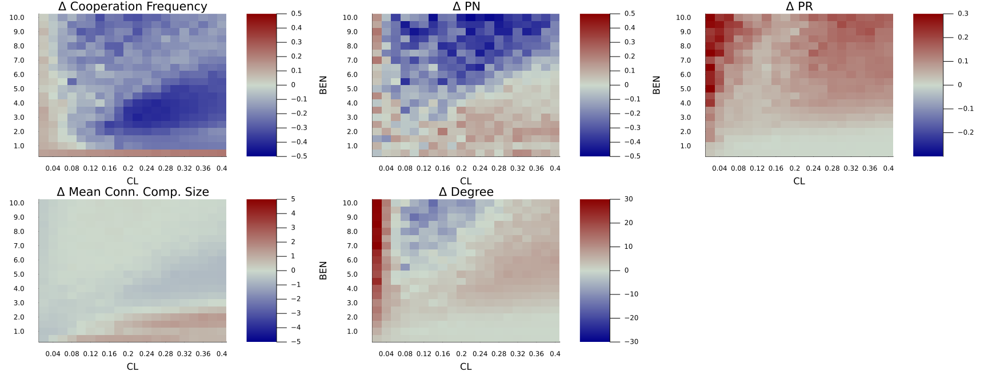

In [150]:
newdata = "neighbor_mom_no_pnd_fixed.csv"
compData = "anyMom_no_pnd_new.csv"

fig1hmaps = [hmap(newdata, compData, 20, 3, "Δ Cooperation Frequency", -0.5, 0.5), 
hmap(newdata, compData, 20, 6, "Δ PN", -0.5, 0.5), 
hmap(newdata, compData, 20, 8, "Δ PR", -0.3, 0.3),
hmap(newdata, compData, 20, 10, "Δ Mean Conn. Comp. Size", -5.0, 5.0), 
hmap(newdata, compData, 20, 4, "Δ Degree", -30.0, 30.0)
]

plot(fig1hmaps..., colorbar = true, grid=false, layout = (2,3), size = (1750, 650)) 


Figure A6. Difference between a strong spatial structure (neighborRange=1) and no spatial structure (anyMom) over a range of costs of linking (CL) and benefits of cooperation (CL), with other inputs (C=0.5, gen=100000, pn0=0.5, distInherit=false, pr0=0.0001, μ=0.01, δ=0.5, σpn=0.01, σpr=0.01, reps=10, population size = 100) being held constant. There was no inheritance discrimination (PNC=PND and PRC=PRD).

In [151]:
function benClDataRead2(data, data2row, range, index::Int)
    df = CSV.read(data, DataFrame, delim=",")
    #df = df[!, [2, 6, 4, 5, 8, 13, 14, 15, 16, 17, 3, 11, 10, 12, 7, 9, 1]] #used for soring by clratio/distFactor/distNeighborRange, including graphCalcs
    df = df[!, [3, 2, 5, 6, 8, 13, 14, 15, 16, 17, 4, 11, 10, 12, 7, 9, 1]] #used for soring by ben/cl, including graphCalcs
    #df = df[!, [6, 9, 2, 3, 7, 8, 10, 4, 5, 1]] #used for when sorting by pn/r
    #sort!(df, [:pn, :pr]) #used for when sorting by pn/r
    sort!(df, [:ben, :cl])
    dfData = Matrix{Float64}(df)
    dataArr = zeros(range, range, 1) #transforms [range^2 * 10] arr to [range, range, 1] arr
    for(i) in 1:range
        dataArr[i, 1, 1] = dfData[i+range*data2row, index]
    end
    #print(dataArr)
    dataArr
end

function dataReadMinus(data, data2, data2row, range, index::Int)
    df = CSV.read(data, DataFrame, delim=",")
    df = df[!, [2, 6, 4, 5, 8, 13, 14, 15, 16, 17, 3, 11, 10, 12, 7, 9, 1]] #used for soring by clratio/distFactor/distNeighborRange, including graphCalcs
    sort!(df, [:cl, :distFactor])
    dfData = Matrix{Float64}(df)
    #print(df)
    dataArr = zeros(range, range, 1) #transforms [range^2 * 10] arr to [range, range, 1] arr
    for(i) in 1:range
        for(j) in 1:range
            dataArr[i, j, 1] = dfData[range*(i-1)+j, index]
        end
    end
    benclData = benClDataRead2(data2, data2row, range, index)
    for(i) in 1:range
        #println(benclData[i, 4, 1], " subt from ", dataArr[i, 20, 1], " equals ", dataArr[i, 20, 1]-benclData[i, 4, 1])
        dataArr[i, :, 1] .-= benclData[i, 1, 1]
    end   
	tempData = transpose(dataArr[:, :, 1])
    return tempData
end

function hmap(data::String, data2::String, data2row::Int, range::Int, index::Int, titles::String, cLow::Float64, chI::Float64) 
    #indexes : 1 yidx   2 xidx   3 coopFreq   4 degree   5 fitness  6 pnc_end   7 pnd_end   8 prc_end  9 prd_end  10 shortestPath 11 connComponents 12 meanCCSize 13 largestCC 14 mean connection distance 15 distance  16 inclusion  17 assortment 
    dataArr = dataReadMinus(data, data2, data2row, range, index)
    x_axis = String[]
    y_axis = String[]
    for(i) in 1:range 
        push!(y_axis, (string(round(0.75+0.25*i/range; digits = 3)))) 
        push!(x_axis, (string(round(0.4*i/range; digits = 3))))
    end
    p = heatmap(x_axis, y_axis,  dataArr[:, :]; title = titles, c=cgrad(:bluesreds), xlabel="CL\n\n",ylabel="DistFactor", clim=(cLow,chI))
    p
end

hmap (generic function with 3 methods)

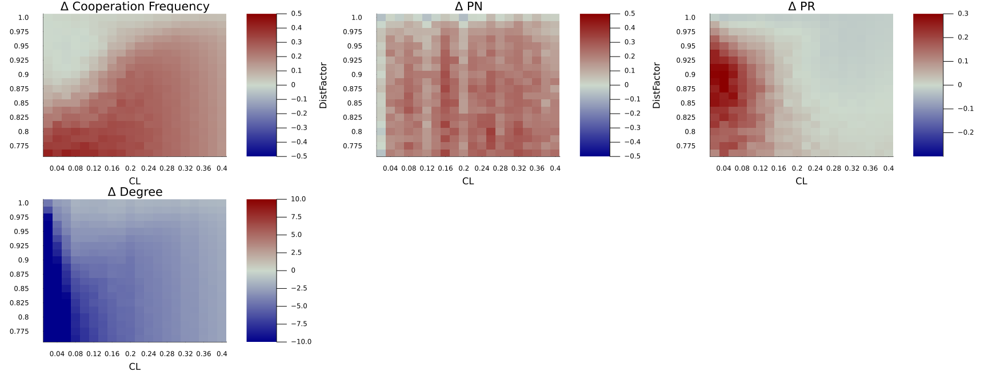

In [152]:
newdata = "distInherit_nmon_no_pnd.csv"
compData = "neighbor_mom_no_pnd_fixed.csv"

fig1hmaps = [hmap(newdata, compData, 4, 20, 3, "Δ Cooperation Frequency", -0.5, 0.5), 
hmap(newdata, compData, 4, 20, 6, "Δ PN", -0.5, 0.5), 
hmap(newdata, compData, 4, 20, 8, "Δ PR", -0.3, 0.3),
hmap(newdata, compData, 4, 20, 4, "Δ Degree", -10.0, 10.0)
]

plot(fig1hmaps..., colorbar = true, grid=false, layout = (2,3), size = (1750, 650)) 


Figure A7. Difference of cooperation frequency, PN, PR, and degree between distance-based inheritance and a strong spatial structure, over a range of distance factors and cost of linking (CL), with other inputs (B=2.0, C=0.5, gen=100000, pn0=0.5, neighborRange=1, pr0=0.0001, μ=0.01, δ=0.5, σpn=0.01, σpr=0.01, reps=10, population size = 100) being held constant. There was no inheritance discrimination (PNC=PND and PRC=PRD).